In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa (the mother of audio files)
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
!pip install patool

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import patoolib
patoolib.extract_archive('Data.zip')

#Ignore the error below. It still extrats the data to a new variable

patool: Extracting Data.zip ...
patool: running /usr/bin/7z x -o./Unpack_wifzjvdx -- Data.zip


PatoolError: ignored

In [ ]:
# Name of genres in "Genres original" file within "Data" file. The Data files includes song files within "Genres origional".
#It also have a file with pictures of Mel Spectrogram, and also cvs files with with features of the songs and genres.
import os
general_path = 'Unpack_krvaiz89'
print(list(os.listdir(f'{general_path}/genres_original/')))

['reggae', 'blues', 'jazz', 'metal', 'country', 'classical', 'hiphop', 'disco', 'rock', 'pop']


In [ ]:
# Importing a jazz song to show its time and frequency behaviors using different features.
y, sr = librosa.load(f'{general_path}/genres_original/jazz/jazz.00002.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

y: [0.00335693 0.00491333 0.00378418 ... 0.05691528 0.05136108 0.03808594] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [ ]:
# Trim the silence from the audio signal to obtain the signal segment that only consists of the sing
audio_file, _ = librosa.effects.trim(y)

print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [0.00335693 0.00491333 0.00378418 ... 0.05691528 0.05136108 0.03808594] 

Audio File shape: (661794,)


In [ ]:
audio_file

array([0.00335693, 0.00491333, 0.00378418, ..., 0.05691528, 0.05136108,
       0.03808594], dtype=float32)

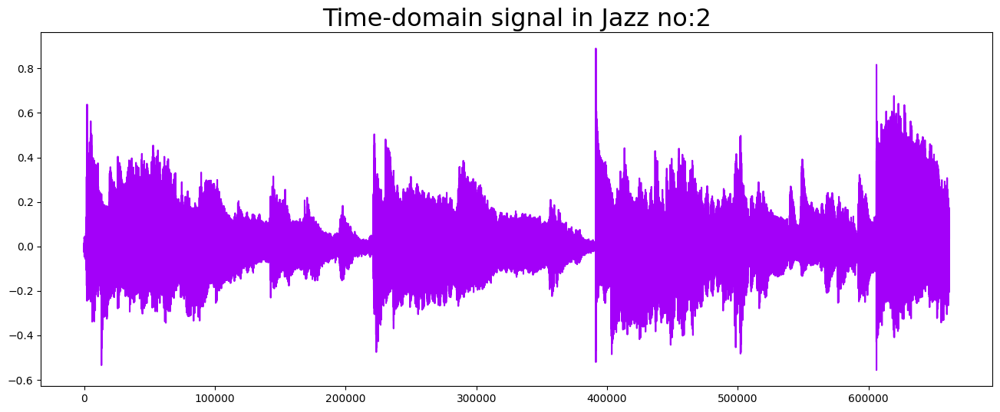

In [ ]:
import librosa
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 6))
plt.plot(audio_file, color="#A300F9")
plt.title("Time-domain signal in Jazz no:2", fontsize=23)
plt.show()


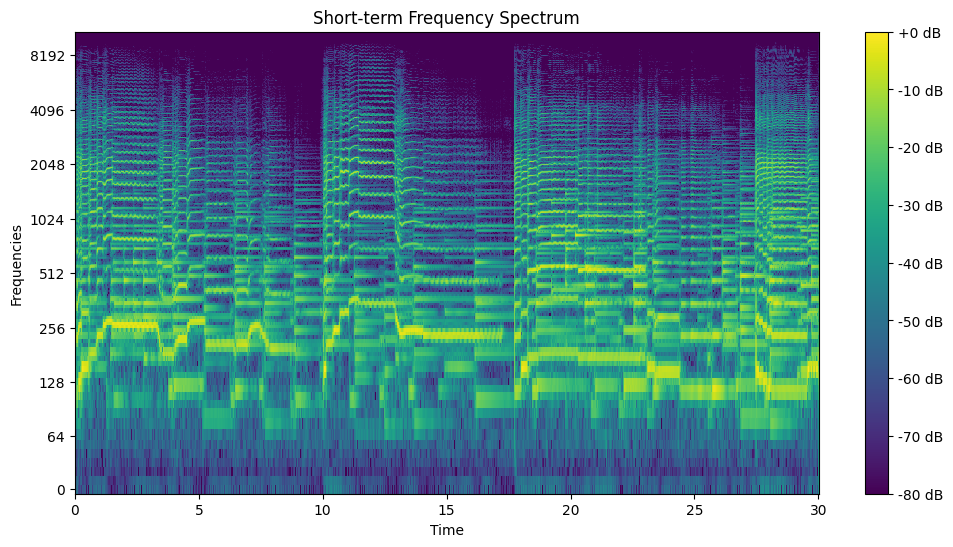

In [ ]:
# Sort-term Frequency spectrum of the selected jazz song (spectrogram)
n_fft = 2048 # FFT window size

# Short-time Fourier transform (different colors below show the frequency spectrum at different times)
hop_length = 512
D = np.abs(librosa.stft(audio_file, n_fft=n_fft, hop_length=hop_length))



# Get the time and frequency axes
time = librosa.frames_to_time(np.arange(D.shape[1]), sr=sr, hop_length=hop_length)
frequencies = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

# Plot the short-term frequency representation
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                         sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='viridis')

plt.colorbar(format='%+2.0f dB')
plt.title('Short-term Frequency Spectrum')
plt.xlabel('Time')
plt.ylabel('Frequencies')
plt.show()

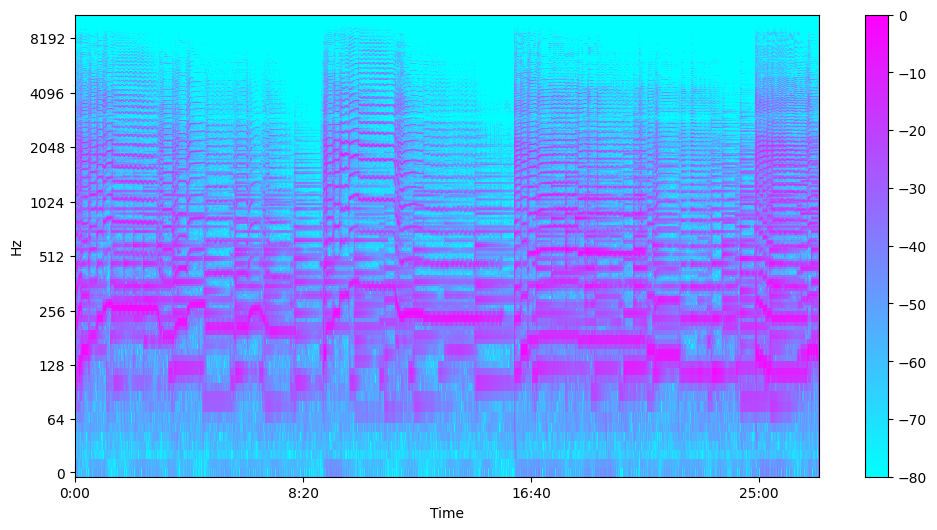

In [ ]:
# Now plotting the spectrogram by converting the amplitude axis to Db.
DB = librosa.amplitude_to_db(D, ref = np.max)

hop_length = int(DB.shape[1] / (DB.shape[0] / sr))  # Calculate hop_length based on spectrogram shape and audio duration

plt.figure(figsize = (12, 6))
librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();

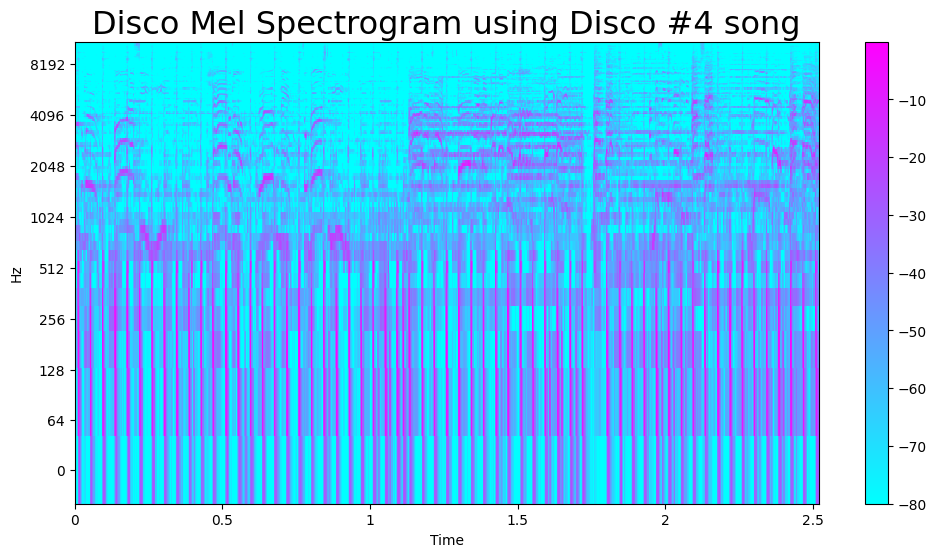

In [ ]:
y, sr = librosa.load(f'{general_path}/genres_original/disco/disco.00004.wav')
y, _ = librosa.effects.trim(y)

S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

hop_length = int(S.shape[1] / (y.shape[0] / sr))  # Calculate hop_length based on spectrogram shape and audio duration

plt.figure(figsize=(12, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar()
plt.title("Disco Mel Spectrogram using Disco #4 song", fontsize=23)
plt.show()

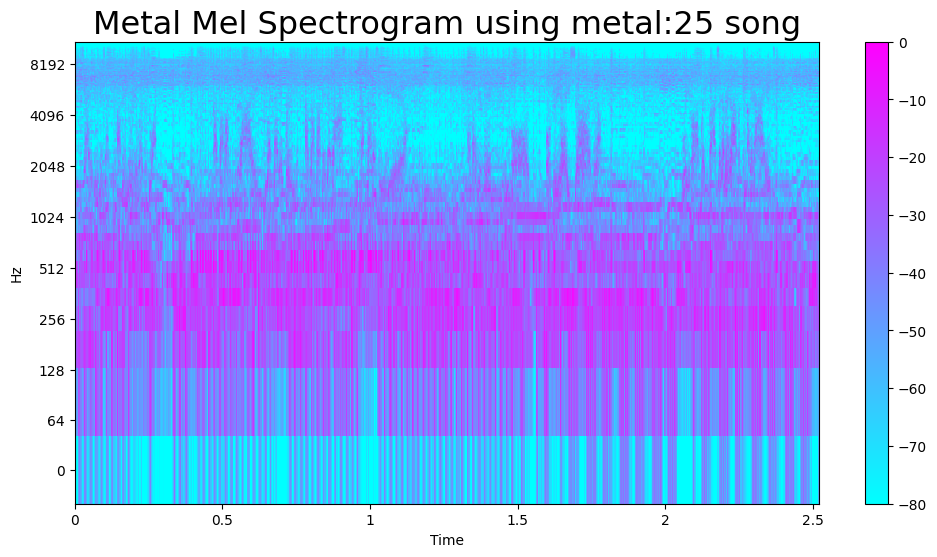

In [ ]:

y, sr = librosa.load(f'{general_path}/genres_original/metal/metal.00015.wav')
y, _ = librosa.effects.trim(y)

S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

hop_length = int(S.shape[1] / (y.shape[0] / sr))  # Calculate hop_length based on spectrogram shape and audio duration

plt.figure(figsize=(12, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar()
plt.title("Metal Mel Spectrogram using metal:25 song", fontsize=23)
plt.show()

In [ ]:
# Total zero_crossings in the first jazz song
zero_crossings = librosa.zero_crossings(audio_file, pad=False)
print(sum(zero_crossings))

38344


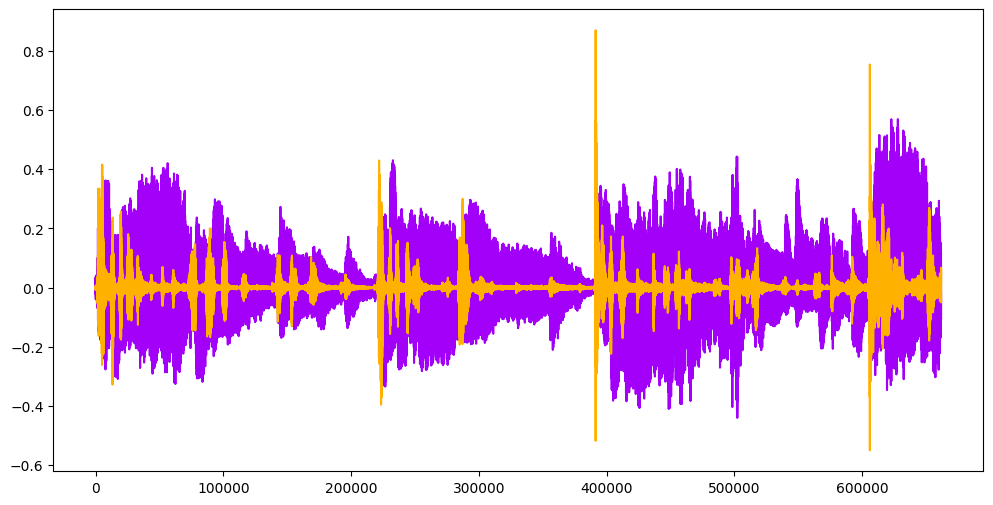

In [ ]:
#plotting the harmonics and perceptrual (shock waves)
y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize = (12, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

In [ ]:
tempo, _ = librosa.beat.beat_track(y=y, sr = sr)
tempo

172.265625

In [ ]:
# Calculating the Spectral Centroids (main dominant frequency)
centroids = librosa.feature.spectral_centroid(y=audio_file, sr=sr)[0]

# Shape is a vector
print('Centroids:', centroids, '\n')
print('Shape of Spectral Centroids:', centroids.shape, '\n')

# Time vector for the centroids
frames = range(len(centroids))
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# function to normalize the sound signal
def normalize(inputsong, axis=0):
    return sklearn.preprocessing.minmax_scale(inputsong, axis=axis)

Centroids: [1052.54772126 1195.5442148  1152.92602549 ...  844.14625408  868.18543569
  923.08209663] 

Shape of Spectral Centroids: (1293,) 

frames: range(0, 1293) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


In [ ]:
t

array([0.00000000e+00, 2.32199546e-02, 4.64399093e-02, ...,
       2.99537415e+01, 2.99769615e+01, 3.00001814e+01])

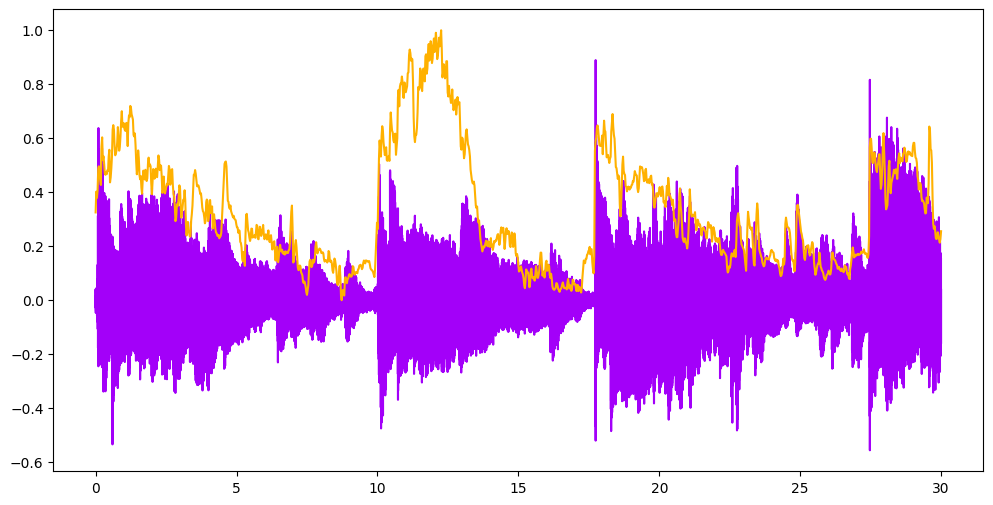

In [ ]:
#Plotting the Spectral Centroid along the waveform
# Computing the time variable for visualization
frames2 = range(len(audio_file))

# Converts frame counts to time (seconds)
t2 = librosa.frames_to_time(frames2)
AA=30

last_value = t2[-1]  # Get the last value of the array
rescaled_arr = t2 * (AA / last_value)  # Rescale the array


plt.figure(figsize = (12, 6))
plt.plot(rescaled_arr,audio_file, color = '#A300F9');
plt.plot(t, normalize(centroids), color='#FFB100');

In [ ]:
rescaled_arr

array([0.00000000e+00, 4.53313952e-05, 9.06627903e-05, ...,
       2.99999093e+01, 2.99999547e+01, 3.00000000e+01])

In [ ]:
len(audio_file)

661794

mfccs shape: (20, 1293)


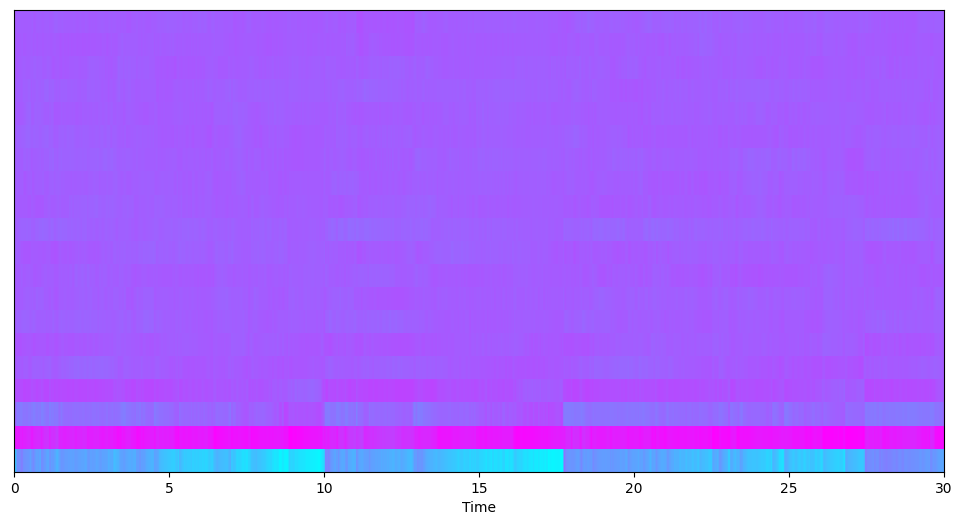

In [ ]:
# Ploting the Mel frequency coefficients which are a small set of features which describes the shape of the spectral envelope
# It is used to model the characteristics of human voice
mfccs = librosa.feature.mfcc(y=audio_file, sr=sr)
print('mfccs shape:', mfccs.shape)


plt.figure(figsize = (12, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap = 'cool');

Mean: 1.1801075e-09 

Var: 1.0


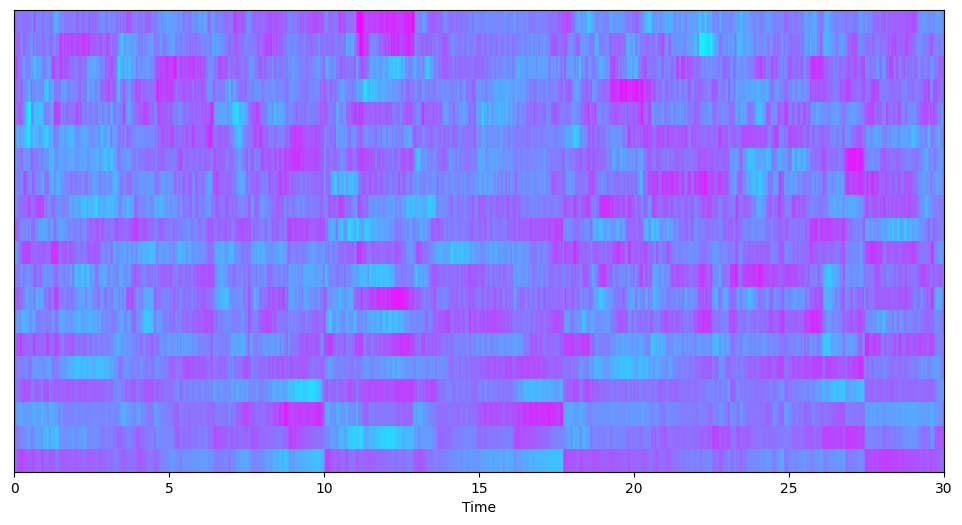

In [ ]:
# Rescaling for better visualization
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print('Mean:', mfccs.mean(), '\n')
print('Var:', mfccs.var())

plt.figure(figsize = (12, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap = 'cool');

Chromogram shape: (12, 2586)


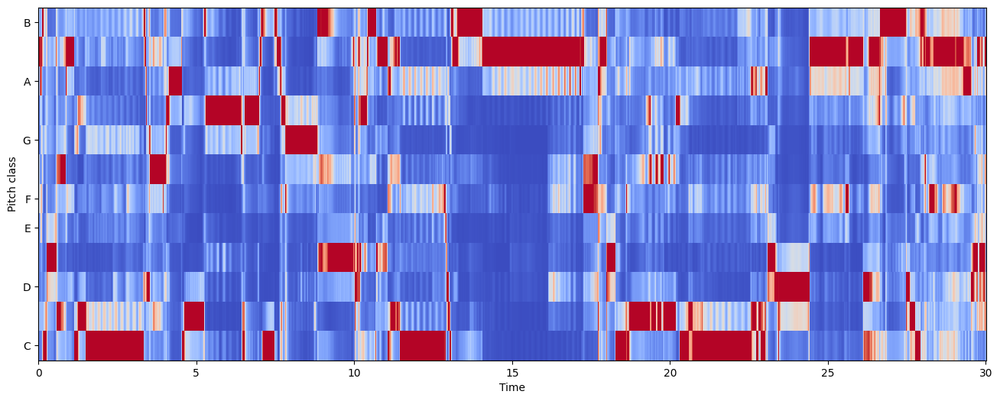

In [ ]:
# Plotting chroma features which are the spectrum of the song projected into 12 bins to represent the 12 different semitones (chromas)
#Ihere I just used an approximate hop_length, the one used for spectrograms can be used.
hop_length = 256

# Chromogram
chromagram = librosa.feature.chroma_stft(y=audio_file, sr=sr, hop_length=hop_length)
print('Chromogram shape:', chromagram.shape)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm');

In [ ]:
# We have the data file with the features of all the audio songs (i.e., the features of the jazz audio song shown above computed for all songs)
data = pd.read_csv(f'{general_path}/features_30_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


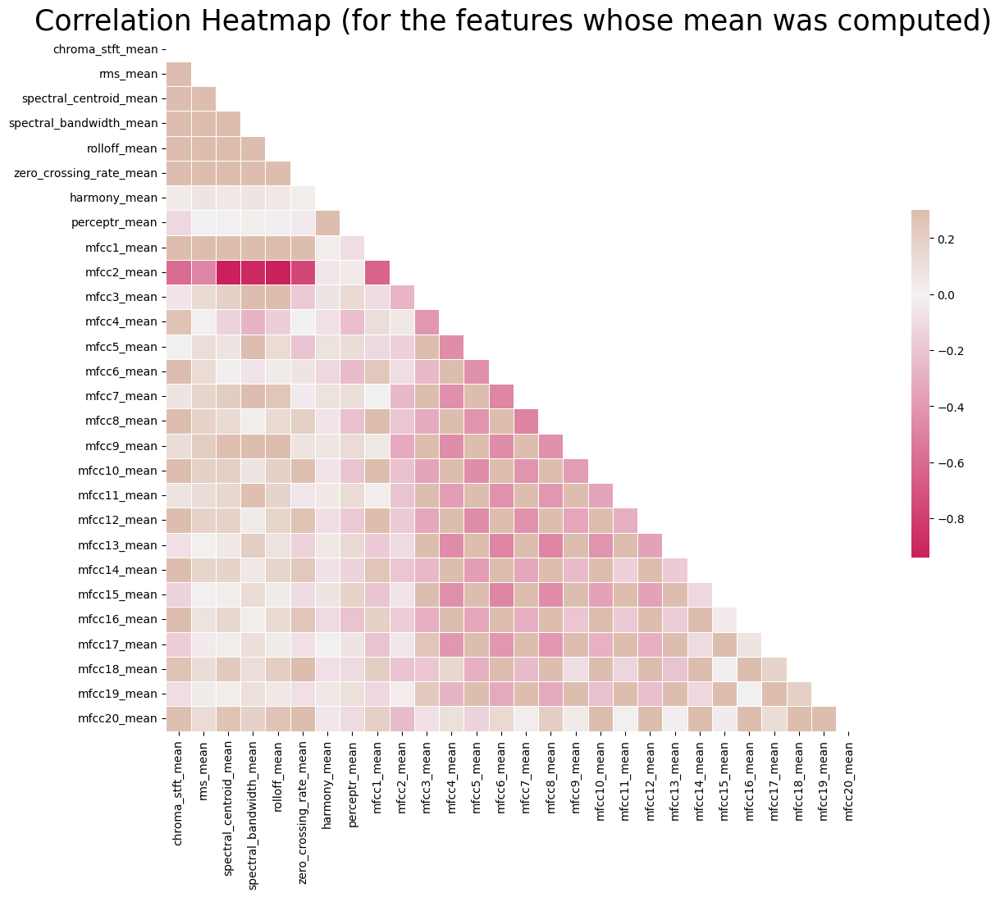

In [ ]:
# Computing the Correlation Matrix using the features whose mean was calcluated
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(16, 11));
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the features whose mean was computed)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

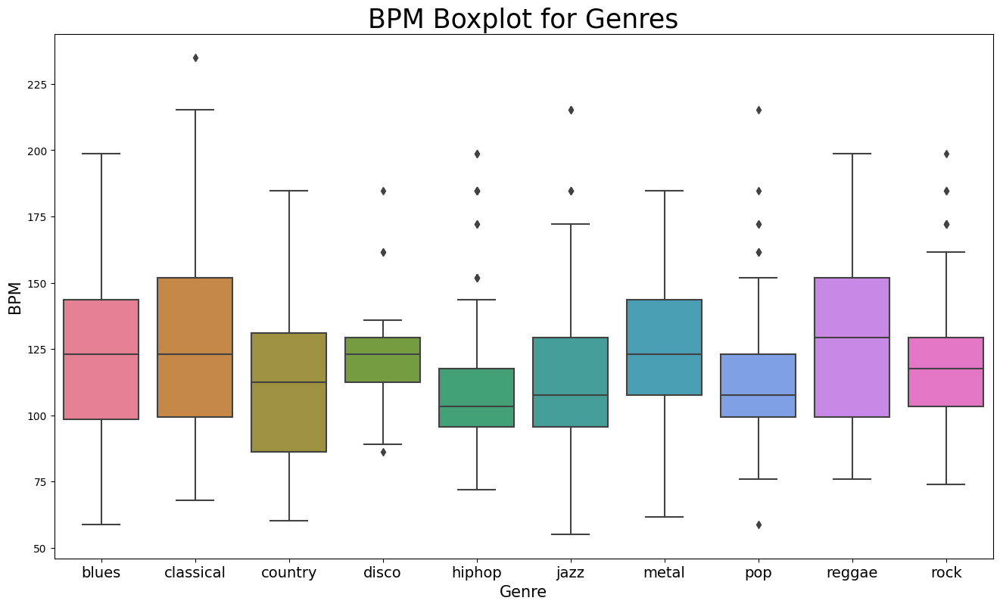

In [ ]:
# Plotbox for genres

x = data[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

In [ ]:
# PCA on Genres for visualization

from sklearn import preprocessing

data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

#### NORMALIZE X ####
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)


#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# concatenate with target label
finalDf = pd.concat([principalDf, y], axis = 1)

pca.explained_variance_ratio_

# 44.93 variance explained

array([0.2439355 , 0.21781804])

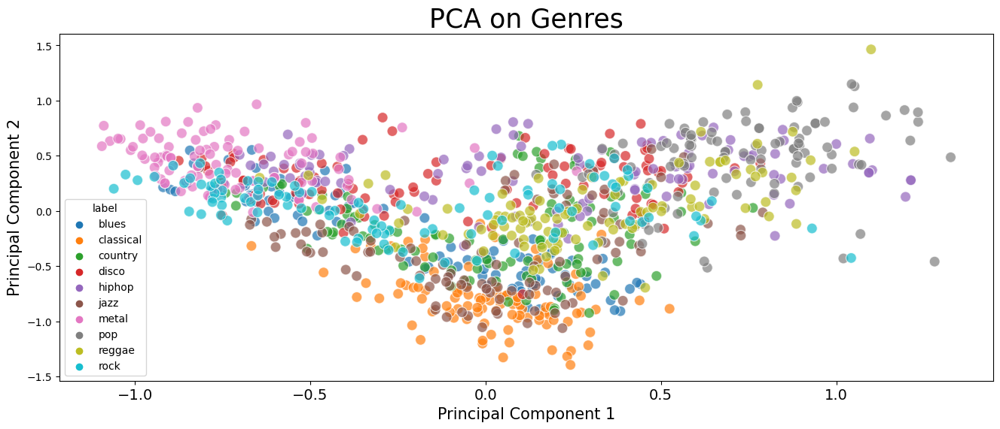

In [ ]:
plt.figure(figsize = (16, 6))
sns.scatterplot(x = "principal component 1", y = "principal component 2", data = finalDf, hue = "label", alpha = 0.7,
               s = 100);

plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)
plt.savefig("PCA Scattert.jpg")

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

In [ ]:
data = pd.read_csv(f'{general_path}/features_30_sec.csv')
data = data.iloc[0:, 1:]
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [ ]:
y = data['label'] # genre variable.
X = data.loc[:, data.columns != 'label'] #select all columns but not the labels

#### NORMALIZE X ####

# Normalize so everything is on the same scale.

cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data.
X = pd.DataFrame(np_scaled, columns = cols)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
y_train

541         jazz
440       hiphop
482       hiphop
422       hiphop
778          pop
         ...    
106    classical
270      country
860       reggae
435       hiphop
102    classical
Name: label, Length: 700, dtype: object

In [ ]:
import numpy as np
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Assuming you have the required data: x_train, y_train, x_test, y_test

# Define the MLPClassifier model
mlp = MLPClassifier()

# Define the hyperparameters grid for optimization
param_grid = {
    'hidden_layer_sizes': [(64,), (128,), (64, 32,), (128, 64,)],
    'activation': ['relu', 'sigmoid'],
    'alpha': [0.0001, 0.001, 0.01],
    'max_iter': [200, 300, 400],
}

# Create GridSearchCV object
grid = GridSearchCV(estimator=mlp, param_grid=param_grid, cv=3)

# Fit the GridSearchCV object to the training data
grid_result = grid.fit(x_train, y_train)

# Get the best model and its hyperparameters
best_model = grid_result.best_estimator_
best_params = grid_result.best_params_

# Evaluate the best model on the test data
y_pred = best_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)

print('Best Hyperparameters:', best_params)
print('Test Accuracy:', accuracy)

Best Hyperparameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (128,), 'max_iter': 300}
Test Accuracy: 0.7


In [ ]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform the categorical labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)

# Define the XGBoost classifier model
xgb_model = xgb.XGBClassifier()

# Define the hyperparameter grid for optimization
param_grid = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

# Perform grid search with cross-validation
grid = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5)
grid.fit(x_train, y_train_encoded)

# Get the best model and its hyperparameters
best_model = grid.best_estimator_
best_params = grid.best_params_


In [ ]:
y_test_encoded

array([5, 7, 7, 6, 4, 6, 6, 5, 8, 1, 8, 0, 6, 9, 9, 8, 2, 8, 7, 3, 5, 1,
       3, 5, 2, 2, 1, 9, 9, 9, 3, 1, 6, 4, 3, 1, 6, 5, 9, 0, 3, 0, 3, 9,
       2, 2, 9, 6, 4, 8, 5, 8, 2, 5, 0, 0, 6, 0, 2, 8, 2, 0, 5, 2, 6, 6,
       6, 8, 0, 5, 1, 4, 5, 7, 2, 2, 6, 0, 5, 3, 6, 0, 2, 0, 3, 5, 9, 7,
       7, 3, 3, 4, 5, 2, 7, 4, 7, 0, 0, 8, 7, 3, 9, 2, 6, 6, 5, 9, 1, 9,
       5, 8, 9, 8, 0, 4, 1, 9, 5, 2, 8, 4, 7, 2, 2, 5, 5, 4, 8, 8, 5, 8,
       2, 9, 5, 0, 1, 2, 0, 0, 0, 2, 7, 2, 8, 9, 8, 2, 8, 3, 6, 1, 9, 4,
       9, 4, 3, 6, 0, 8, 5, 7, 6, 6, 8, 6, 2, 6, 3, 3, 3, 4, 1, 9, 4, 3,
       2, 2, 8, 6, 4, 6, 3, 5, 8, 1, 3, 3, 9, 7, 9, 8, 6, 1, 2, 4, 3, 2,
       6, 0, 0, 5, 6, 5, 8, 5, 1, 9, 4, 8, 0, 1, 9, 8, 6, 3, 6, 2, 9, 7,
       3, 7, 9, 0, 8, 0, 5, 3, 9, 5, 3, 9, 4, 5, 0, 0, 2, 9, 1, 3, 0, 2,
       5, 7, 3, 1, 4, 0, 0, 2, 0, 9, 7, 8, 3, 3, 5, 9, 9, 0, 7, 4, 0, 2,
       3, 8, 7, 3, 6, 3, 4, 1, 9, 2, 5, 0, 1, 6, 0, 7, 5, 7, 2, 2, 2, 7,
       3, 4, 2, 9, 9, 7, 5, 4, 3, 4, 9, 4, 0, 1])

Accuracy: 0.75
Precision: 0.7619767889318114
Recall: 0.7687118940013816
F1-score: 0.7586930482562134
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.69      0.72        35
           1       0.87      1.00      0.93        20
           2       0.69      0.73      0.71        37
           3       0.88      0.65      0.75        34
           4       0.64      0.88      0.74        24
           5       0.93      0.82      0.87        33
           6       0.79      0.87      0.83        30
           7       0.78      0.91      0.84        23
           8       0.73      0.55      0.63        29
           9       0.57      0.60      0.58        35

    accuracy                           0.75       300
   macro avg       0.76      0.77      0.76       300
weighted avg       0.76      0.75      0.75       300

Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}


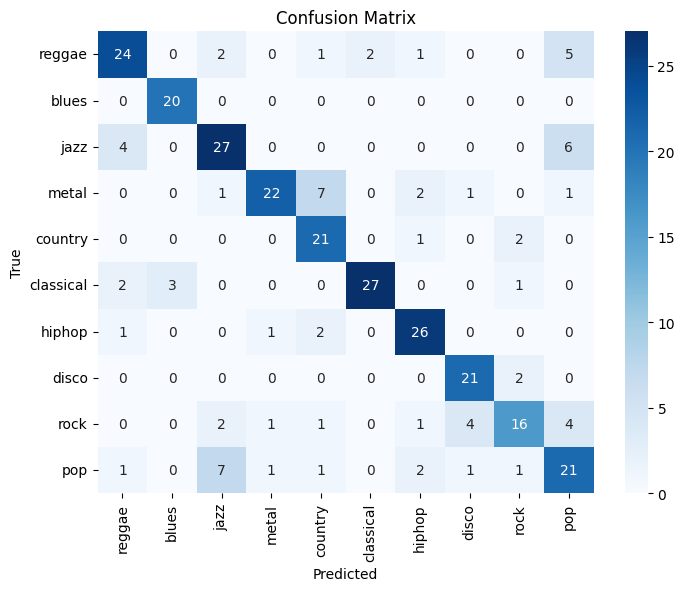

In [ ]:
# Evaluate the best model on the test data
y_test_encoded = label_encoder.fit_transform(y_test)
y_pred = best_model.predict(x_test)
accuracy = accuracy_score(y_test_encoded, y_pred)
precision = precision_score(y_test_encoded, y_pred,average='macro')
recall = recall_score(y_test_encoded, y_pred,average='macro')
f1 = f1_score(y_test_encoded, y_pred,average='macro')
classification_rep = classification_report(y_test_encoded, y_pred)


# Create confusion matrix
cm = confusion_matrix(y_test_encoded, y_pred)

# Print evaluation metrics and best hyperparameters
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Classification Report:\n", classification_rep)
print("Best Hyperparameters:", best_params)

# Plot confusion matrix
class_names = list(os.listdir(f'{general_path}/genres_original/'))
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
class_names= list(os.listdir(f'{general_path}/genres_original/'))
class_names

['reggae',
 'blues',
 'jazz',
 'metal',
 'country',
 'classical',
 'hiphop',
 'disco',
 'rock',
 'pop']

In [ ]:
########## MUSIC RECOMMENDATION SYSTEM #########

import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

data = pd.read_csv(f'{general_path}/features_30_sec.csv', index_col='filename')
labels = data[['label']]
data = data.drop(columns=['length','label'])
data.head()

data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

Scaled data type: <class 'numpy.ndarray'>


In [ ]:
# COMPUTE Cosine similarity
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# CREATING A DATA FRAME: the row index and column names as labels
similarity_df_labels = pd.DataFrame(similarity)
similarity_df_labels = similarity_df_labels.set_index(labels.index)
similarity_df_labels.columns = labels.index

similarity_df_labels.head()

Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


In [ ]:
def the_most_familiar_songs(name):
    # Find songs most similar to another song
    mostsimilar = similarity_df_labels[name].sort_values(ascending = False)

    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = mostsimilar.drop(name)

    # Show the 5 top matches
    print("\n*******\nSimilar songs to ", name)
    print(mostsimilar.head(5))

In [ ]:
# pop.00019 - Britney Spears "Hit me baby one more time"
the_most_familiar_songs('pop.00019.wav')

ipd.Audio(f'{general_path}/genres_original/pop/pop.00019.wav')


*******
Similar songs to  pop.00019.wav
filename
pop.00023.wav    0.862836
pop.00034.wav    0.860499
pop.00078.wav    0.829135
pop.00088.wav    0.824456
pop.00091.wav    0.802269
Name: pop.00019.wav, dtype: float64


In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00023.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00034.wav')

In [ ]:
# metal.00002 - Iron Maiden "Flight of Icarus"
the_most_familiar_songs('metal.00002.wav')

ipd.Audio(f'{general_path}/genres_original/metal/metal.00002.wav')


*******
Similar songs to  metal.00002.wav
filename
metal.00028.wav    0.904367
metal.00059.wav    0.896096
rock.00018.wav     0.891910
rock.00017.wav     0.886526
rock.00016.wav     0.867508
Name: metal.00002.wav, dtype: float64


In [ ]:
ipd.Audio(f'{general_path}/genres_original/metal/metal.00028.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/metal/metal.00059.wav')